# Exploratory Data Anlysis

In [5]:
# pip install plotly==5.14.0

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

import plotly.express as ex
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.offline as pyo
import plotly.express as px

In [7]:
df = pd.read_csv("BankChurners.csv")

In [8]:
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [9]:
df.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'],
      dtype='object')

In [10]:
#rename last 2 cols for better display
df.rename(columns={'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1': 'Bayes1', 
                   'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2': 'Bayes2'}, inplace=True)

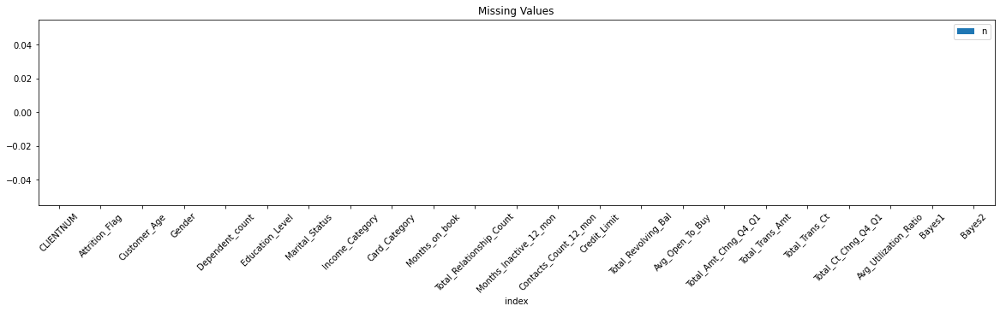

In [11]:
#Missing values count
plt.rcParams['figure.figsize'] = [20,4]
a = df.isna().sum().reset_index(name="n").plot.bar(x='index', y='n', rot=45).set(title = 'Missing Values') #Missing values count

In [12]:
#duplicate rows count
len(df)-len(df.drop_duplicates())

0

In [13]:
#Percentage of Attrited customers
ex.pie(df,names='Attrition_Flag',title='Proportion Of Attrited customers',hole=0.3)

In [14]:
ex.pie(df,names='Gender',title='Proportion Of Gender',hole=0.3)

In [15]:
ex.pie(df,names='Education_Level',title='Proportion Of Education Levels',hole=0.3)

In [16]:
df['Education_Level'].value_counts()["Unknown"]

1519

In [17]:
ex.pie(df,names='Marital_Status',title='Proportion Of Marital Status',hole=0.3)

In [18]:
df['Marital_Status'].value_counts()["Unknown"]

749

In [20]:
ex.pie(df,names='Card_Category',title='Proportion Of Different Card Categories',hole=0.3)

In [21]:
ex.pie(df,names='Income_Category',title='Proportion Of Different Income Categories',hole=0.3)

In [22]:
df['Income_Category'].value_counts()["Unknown"]

1112

In [23]:
for i in df.columns:
    fig = px.histogram(df, x= i, color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#4696f9",
                1: "#DC3912"})
    fig.update_layout(bargap=0.2)
    fig.show()

In [24]:
#Customer_Age: Existing vs Attrited Customer
fig = px.histogram(df, x="Customer_Age", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#4696f9",
                1: "#DC3912"})
fig.update_layout(bargap=0.2)
fig.show()

In [25]:
#binning customer age data
df['Age']=0
df.loc[(df['Customer_Age']>25)&(df['Customer_Age']<=35),'Age']= "25-35"
df.loc[(df['Customer_Age']>35)&(df['Customer_Age']<=45),'Age']= "35-45"
df.loc[(df['Customer_Age']>45)&(df['Customer_Age']<=55),'Age']= "45-55"
df.loc[(df['Customer_Age']>55)&(df['Customer_Age']<=65),'Age']= "55-65"
df.loc[df['Customer_Age']>65,'Age']= ">65"

In [26]:
#Age: Existing vs Attrited Customer
fig = px.histogram(df, x="Age", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#4696f9",
                1: "#DC3912"})
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.update_layout(bargap=0.2)
fig.show()

In [27]:
#Gender: Existing vs Attrited Customer
fig = px.histogram(df, x="Gender", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#4696f9",
                1: "#DC3912"})

fig.update_layout(bargap=0.2)
fig.show()

In [28]:
#Dependent_count: Existing vs Attrited Customer
fig = px.histogram(df, x="Dependent_count", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#4696f9",
                1: "#DC3912"})
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.update_layout(bargap=0.2)
fig.show()

In [29]:
#Education_Level: Existing vs Attrited Customer
fig = px.histogram(df, x="Education_Level", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#4696f9",
                1: "#DC3912"})
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.update_layout(bargap=0.2)
fig.show()

In [30]:
#Marital_Status: Existing vs Attrited Customer
fig = px.histogram(df, x="Marital_Status", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#4696f9",
                1: "#DC3912"})

fig.update_layout(bargap=0.2)
fig.show()

In [31]:
#Income_Category: Existing vs Attrited Customer
fig = px.histogram(df, x="Income_Category", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#4696f9",
                1: "#DC3912"})

fig.update_layout(bargap=0.2)
fig.show()

In [32]:
#Card_Category: Existing vs Attrited Customer
fig = px.histogram(df, x="Card_Category", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#4696f9",
                1: "#DC3912"})
fig.update_layout(bargap=0.2)
fig.show()

In [33]:
#Binning Months_on_book for better visualisation
df['Time_with_Bank']=0
df.loc[(df['Months_on_book']>=0)&(df['Months_on_book']<=10),'Time_with_Bank']= "<10"
df.loc[(df['Months_on_book']>10)&(df['Months_on_book']<=20),'Time_with_Bank']= "10-20"
df.loc[(df['Months_on_book']>20)&(df['Months_on_book']<=30),'Time_with_Bank']= "20-30"
df.loc[(df['Months_on_book']>30)&(df['Months_on_book']<=40),'Time_with_Bank']= "30-40"
df.loc[df['Months_on_book']>50,'Time_with_Bank']= ">"

In [34]:
#Time_with_Bank: Existing vs Attrited Customer
fig = px.histogram(df, x="Time_with_Bank", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#4696f9",
                1: "#DC3912"})
fig.update_layout(bargap=0.2)
fig.show()

In [35]:
#Total_Relationship_Count: Existing vs Attrited Customer
fig = px.histogram(df, x="Total_Relationship_Count", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#4696f9",
                1: "#DC3912"})
fig.update_layout(bargap=0.2)
fig.show()

In [36]:
#Months Inactive: Existing vs Attrited Customer
fig = px.histogram(df, x="Months_Inactive_12_mon", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#4696f9",
                1: "#DC3912"})

fig.update_layout(bargap=0.2)
fig.show()

In [37]:
#Contacts_Count_12_mon: Existing vs Attrited Customer
fig = px.histogram(df, x="Contacts_Count_12_mon", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#4696f9",
                1: "#DC3912"})

fig.update_layout(bargap=0.2)
fig.show()

In [38]:
#Credit_Limit: Existing vs Attrited Customer
fig = px.histogram(df, x="Credit_Limit", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#4696f9",
                1: "#DC3912"})

fig.update_layout(bargap=0.2)
fig.show()

In [39]:
#Total_Revolving_Bal: Existing vs Attrited Customer
fig = px.histogram(df, x="Total_Revolving_Bal", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#4696f9",
                1: "#DC3912"})

fig.update_layout(bargap=0.2)
fig.show()

In [40]:
#Total_Amt_Chng_Q4_Q1: Existing vs Attrited Customer
fig = px.histogram(df, x="Total_Amt_Chng_Q4_Q1", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#4696f9",
                1: "#DC3912"})

fig.update_layout(bargap=0.2)
fig.show()

In [41]:
#Total_Trans_Amt: Existing vs Attrited Customer
fig = px.histogram(df, x="Total_Trans_Amt", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#4696f9",
                1: "#DC3912"})

fig.update_layout(bargap=0.2)
fig.show()

In [42]:
#Total_Trans_Count: Existing vs Attrited Customer
fig = px.histogram(df, x="Total_Trans_Ct", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#4696f9",
                1: "#DC3912"})

fig.update_layout(bargap=0.2)
fig.show()

In [43]:
#Total transaction count vs Total Transaction Amount
fig = px.scatter(df, x='Total_Trans_Amt',y='Total_Trans_Ct',template='plotly_white');
fig.show()

In [44]:
#Avg_Utilization_Ratio: Existing vs Attrited Customer
fig = px.histogram(df, x="Avg_Utilization_Ratio", color ="Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group',color_discrete_sequence={
                0: "#4696f9",
                1: "#DC3912"})

fig.update_layout(bargap=0.2)
fig.show()

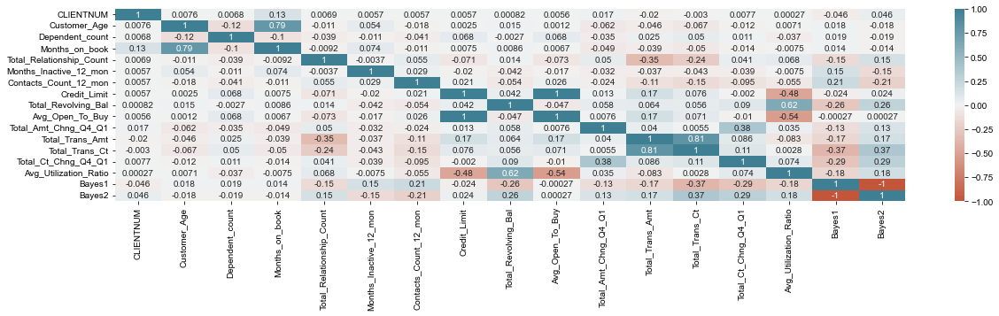

In [45]:
corr = df.corr()
ax = sns.heatmap(corr,
            vmin=-1, vmax=1, center=0,
            cmap=sns.diverging_palette(20, 220, n=200),
            annot=True)
sns.set(rc={'figure.figsize':(20,15)})

In [46]:
fig = px.scatter(df, x='Credit_Limit',y='Avg_Open_To_Buy',template='plotly_white');
fig.show()